In [85]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import poisson, norm
from lcutils import *
import pandas as pd
from scipy.special import pdtrc, ndtri, erfinv
from lcutils import par_default as par

In [88]:
source = 'SGR15'
scw = '003700020010'
rev = scw[0:4]
! mkdir -p /Users/toast/Dropbox/inaf/test0
! [[ ! -f /Users/toast/Dropbox/inaf/test0/{source}_{scw}_evts_h.fits.gz ]] && (knock_ssh -H werewolf.lambrate.inaf.it -n; scp werewolf.lambrate.inaf.it:/storage/topinka/{source}/out/{rev}/{scw}_evts_h.fits.gz /Users/toast/Dropbox/inaf/test0/{source}_{scw}_evts_h.fits.gz)
! [[ ! -f /Users/toast/Dropbox/inaf/test0/{source}_{rev}_flares_6s.csv ]]  && (knock_ssh -H werewolf.lambrate.inaf.it -n; scp werewolf.lambrate.inaf.it:{source}/flares/{rev}_flares_6s.csv /Users/toast/Dropbox/inaf/test0/{source}_{rev}_flares_6s.csv)

fn = f"/Users/toast/Dropbox/inaf/test0/{scw}_evts_h.fits.gz"
flare_fn = f"/Users/toast/Dropbox/inaf/test0/{rev}_flares_6s.csv"
fn, flare_fn

0037_flares_6s.csv                            100% 5768KB  10.7MB/s   00:00    


('/Users/toast/Dropbox/inaf/test0/003700020010_evts_h.fits.gz',
 '/Users/toast/Dropbox/inaf/test0/0037_flares_6s.csv')

In [80]:
flare_filelist = !ls /Users/toast/Dropbox/inaf/test0/{rev}_flares_6s.csv
flares = pd.DataFrame(columns= ["scw", "dt0", "t_start_ijd", "t_start", "t_end", "duration", "t_peak", "t_peak_ijd", "mu", "std", "snr_G", "snr_P", "snr_peak_G", "snr_peak_P", "net_cts", "pif_coverage", "good"]
)
for f in flare_filelist:
    flares = flares.append(pd.read_csv(f, delimiter="\s+", converters={0: lambda x: str(x)}), ignore_index=True, sort=False)
flares = flares[ (flares['snr_G'] > 8.0) ]# & (flares['mu'] > 0.0 )]
print(len(flares))
#flares.tail(5)

33090


In [82]:
#flares[ flares['scw'].apply(lambda x: x[0:4]) == rev ]

In [83]:
#flares[ flares['scw'] == scw ]

In [84]:
#flares.sort_values('snr_G', ascending=False).head()

<ipython-input-77-c49bb70aa011>:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(12,4))


352


,scw,dt0,t_start_ijd,t_start,t_end,duration,t_peak,t_peak_ijd,mu,std,snr_G,snr_P,snr_peak_G,snr_peak_P,net_cts,pif_coverage,good
0,003700020010,0.01,1127.238075,2.51,2.87,0.36,2.82,1127.238079,0.56,0.68,9.0,6.8,18.3,7.9,36.9,0.452,1
2,003700020010,0.01,1127.238184,11.89,11.91,0.02,11.89,1127.238184,0.56,0.68,9.2,5.4,10.9,5.6,8.9,0.452,1
3,003700020010,0.01,1127.238212,14.33,14.35,0.02,14.33,1127.238212,0.56,0.68,12.4,6.6,15.3,7.0,11.9,0.452,1
4,003700020010,0.01,1127.238249,17.50,17.51,0.01,17.50,1127.238249,0.56,0.68,19.8,8.3,19.8,8.3,13.4,0.452,1
5,003700020010,0.01,1127.238251,17.71,18.01,0.30,17.76,1127.238252,0.56,0.68,8.7,6.5,27.1,10.1,32.3,0.452,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
432,003700020010,0.01,1127.270508,2804.67,2804.68,0.01,2804.67,1127.270508,0.56,0.68,10.9,5.6,10.9,5.6,7.4,0.452,1
433,003700020010,0.01,1127.270666,2818.33,2818.66,0.33,2818.39,1127.270666,0.56,0.68,13.5,9.4,71.2,18.7,52.6,0.452,1
434,003700020010,0.01,1127.270700,2821.29,2821.40,0.11,2821.35,1127.270701,0.56,0.68,8.4,5.9,18.3,7.9,18.9,0.452,1
435,003700020010,0.01,1127.270803,2830.23,2830.26,0.03,2830.23,1127.270803,0.56,0.68,10.5,6.2,16.8,7.4,12.3,0.452,1


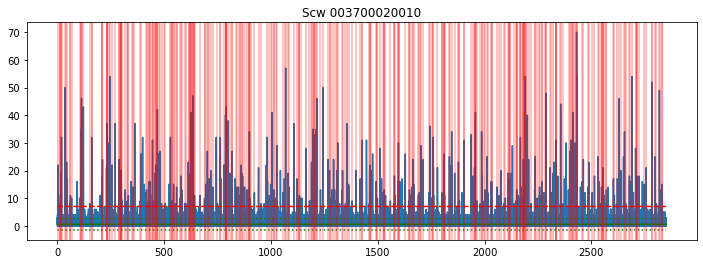

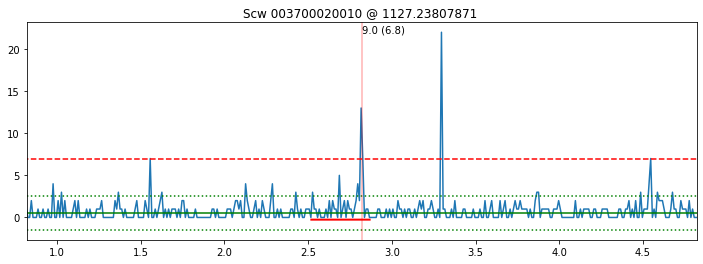

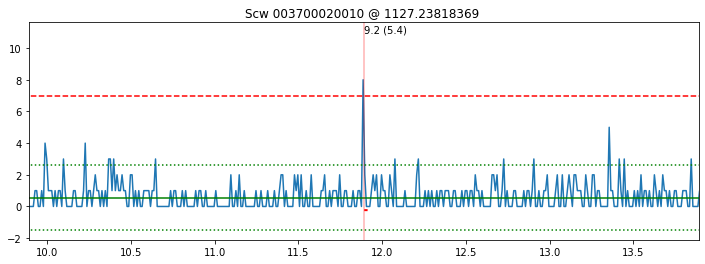

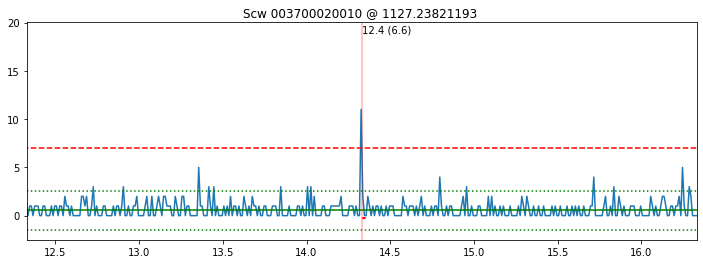

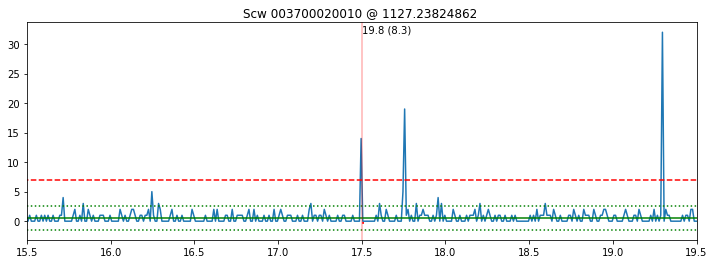

...

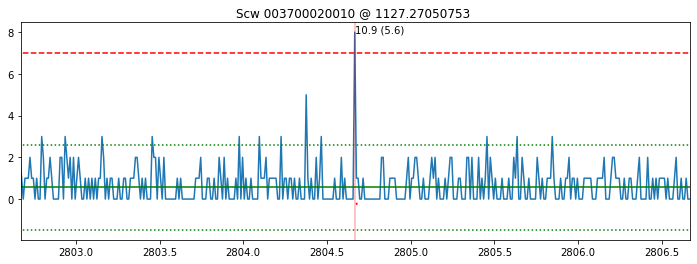

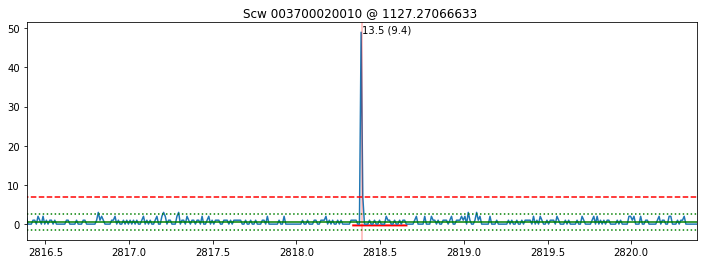

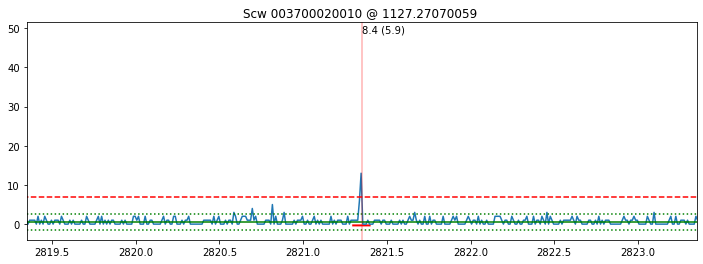

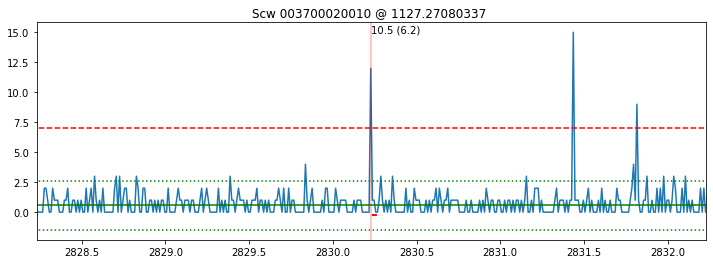

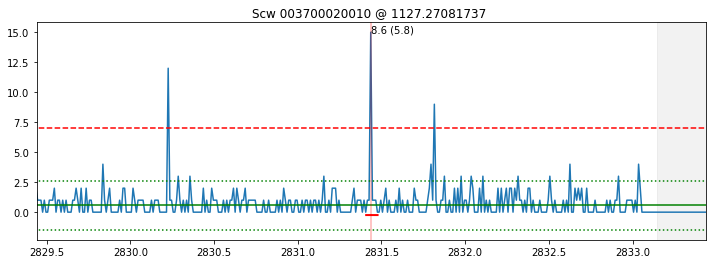

In [77]:
#scw = '029100750010'
#rev = scw[0:4]

#fn = f"/Users/toast/Dropbox/inaf/test/{rev}/{scw}_evts_h.fits.gz"
lc = get_lightcurve(fn, par=par, return_gti=True)
t, r = lc.t, lc.r
scwflares = flares[ flares['scw']==scw ]
mu = scwflares['mu'].values[0]
std = scwflares['std'].values[0]
peaks = scwflares['t_peak'].values
t_start = scwflares['t_start'].values
t_end = scwflares['t_end'].values
peaks_ijd = scwflares['t_peak_ijd'].values
sig = scwflares['snr_G'].values
sigP = scwflares['snr_P'].values
threshold = poisson(mu).isf(par['prob_th'])

plt.figure(figsize=(12,4))
plot_all(t,r,peaks, mu,std,threshold, gti=lc.gti, alpha=0.3)
plt.title("Scw {0}".format(scw))
for tp, tp_ijd, s,sp, t_s, t_e in zip(peaks, peaks_ijd, sig, sigP, t_start, t_end):
    plt.figure(figsize=(12,4))
    rng = (t > tp - 4) & (t < tp + 4)
    m = np.max(r[rng])
    plot_all(t[rng],r[rng],np.array([tp]), mu,std,threshold, gti=lc.gti[rng], alpha=0.3)
    plt.annotate("{0:.1f} ({1:.1f})".format(s, sp), xy=(tp,m))
    plt.fill_betweenx(-0.2*np.ones_like(t[rng]), t_s, t_e, color="r", linewidth=2)
    plt.xlim( ( tp - 2, tp + 2) )
    plt.title("Scw {0} @ {1} ".format(scw, tp_ijd))
print(len(scwflares))
scwflares

In [79]:
scwflares.sort_values("snr_G", ascending=False).head(5)

,scw,dt0,t_start_ijd,t_start,t_end,duration,t_peak,t_peak_ijd,mu,std,snr_G,snr_P,snr_peak_G,snr_peak_P,net_cts,pif_coverage,good
430,003700020010,0.01,1127.270272,2784.35,2784.38,0.03,2784.36,1127.270272,0.56,0.68,51.2,18.2,75.6,19.4,60.3,0.452,1
199,003700020010,0.01,1127.252127,1216.56,1216.66,0.10,1216.64,1127.252128,0.56,0.68,36.9,17.6,66.8,17.9,79.4,0.452,1
211,003700020010,0.01,1127.253238,1312.58,1312.60,0.02,1312.59,1127.253238,0.56,0.68,31.1,12.3,43.3,13.7,29.9,0.452,1
157,003700020010,0.01,1127.248450,898.91,898.94,0.03,898.93,1127.248450,0.56,0.68,29.1,12.5,49.2,14.8,34.3,0.452,1
169,003700020010,0.01,1127.249678,1005.02,1005.13,0.11,1005.04,1127.249678,0.56,0.68,27.4,14.4,59.4,16.7,61.9,0.452,1
